In [1]:
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

In [3]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt
    import matplotlib.gridspec as gridspec
    gs = gridspec.GridSpec(nRows, nCols)
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        plt.subplot(nRows, nCols,i+1)
        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')
    plt.show()

In [4]:
def InfoImage(IM):
    Image = IM
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    if(Channel == 2):
        print("Min Intensity: ", IM.min(), " Max Intensity: ", IM.max())
    else:
        print("Red - Min Intensity: ", IM[:,:,0].min(), " Max Intensity: ", IM[:,:,0].max())
        print("Green - Min Intensity: ", IM[:,:,1].min(), " Max Intensity: ", IM[:,:,1].max())
        print("Blue - Min Intensity: ", IM[:,:,2].min(), " Max Intensity: ", IM[:,:,2].max())

In [5]:
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    from skimage.transform import rescale, resize
    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth
    Height = DesiredHeight
    if((Width == 0) & (Height == 0)):
        return IM
    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)
    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)
    dim = (Width, Height)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST)
    return resizedIM

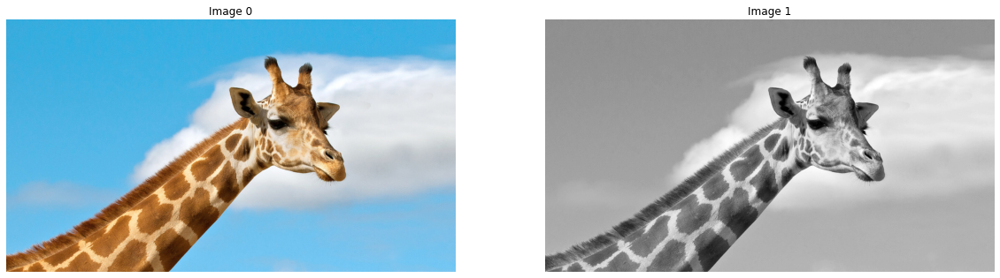

In [6]:
# Read Image

image_color = imread("Image/giraffe.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)


 image_color :
Width :  1920  Height :  1080  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255

 image_scale01 :
Width :  960  Height :  1080  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255

 image_scale02 :
Width :  960  Height :  540  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255

 image_scale03 :
Width :  1920  Height :  540  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255


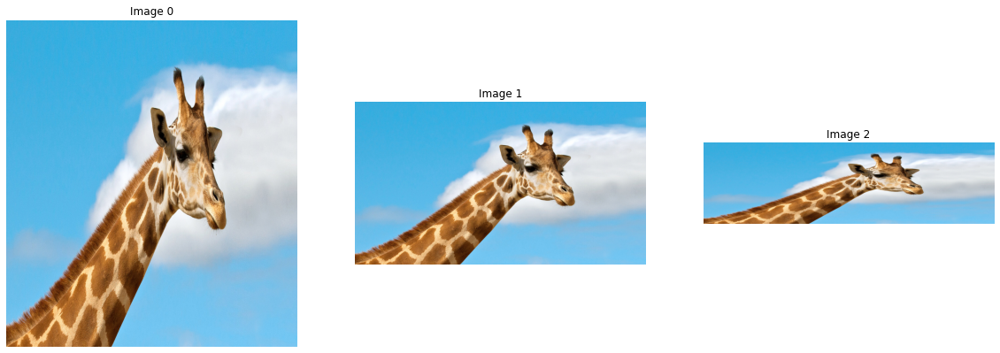

In [7]:
# Scaling

image_scale01 = cv2.resize(image_color,None,fx=0.5, fy=1, interpolation = cv2.INTER_CUBIC)
image_scale02 = cv2.resize(image_color,None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)
image_scale03 = cv2.resize(image_color,None,fx=1, fy=0.5, interpolation = cv2.INTER_CUBIC)
print("\n image_color :")
InfoImage(image_color)
print("\n image_scale01 :")
InfoImage(image_scale01)
print("\n image_scale02 :")
InfoImage(image_scale02)
print("\n image_scale03 :")
InfoImage(image_scale03)
ShowImage([image_scale01, image_scale02, image_scale03], 1, 3)

In [8]:
# Translation

rows,cols = image_color.shape[:2]
TranslationMatrix = np.float32([[1,0,200],[0,1,0]])
image_translation01 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))
TranslationMatrix = np.float32([[1,0,0],[0,1,200]])
image_translation02 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))
TranslationMatrix = np.float32([[1,0,200],[0,1,200]])
image_translation03 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))
TranslationMatrix = np.float32([[1,0,-200],[0,1,-200]])
image_translation04 = cv2.warpAffine(image_color,TranslationMatrix,(cols,rows))

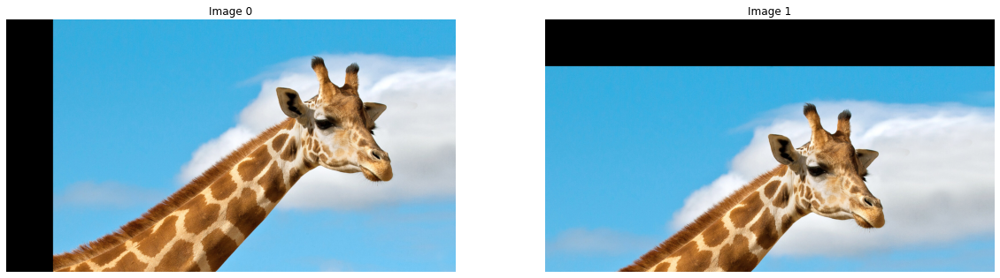

In [9]:
ShowImage([image_translation01, image_translation02], 1, 2)

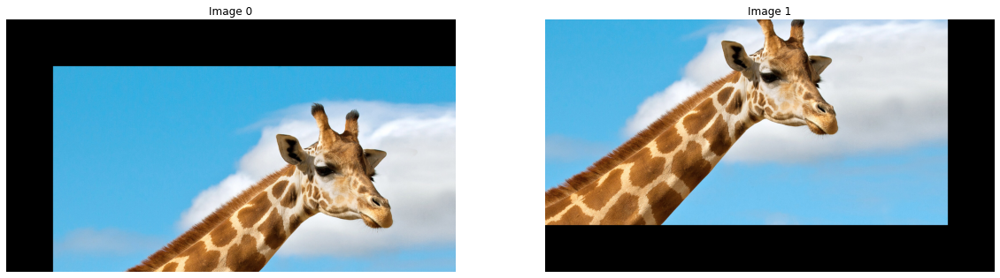

In [10]:
ShowImage([image_translation03, image_translation04], 1, 2)

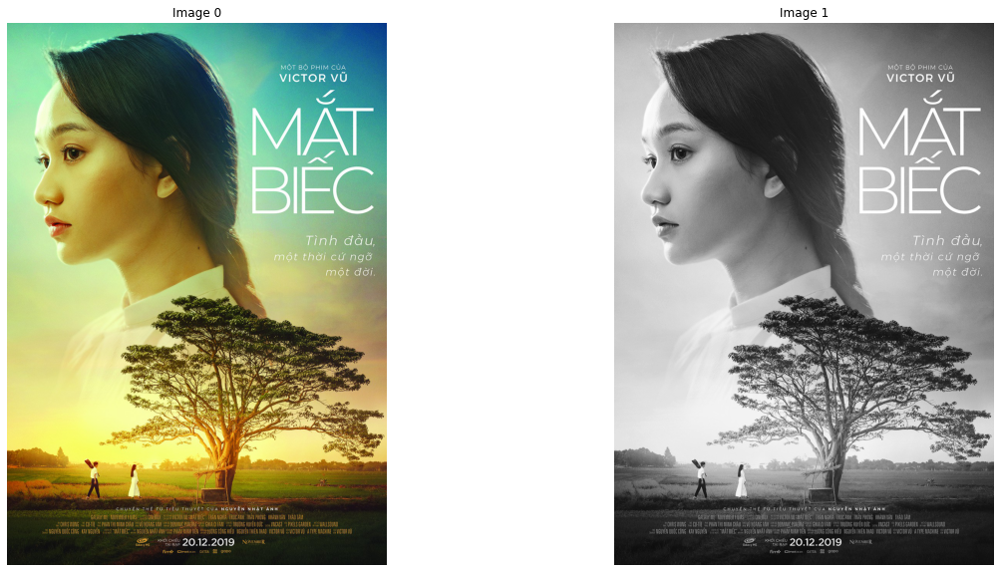

In [12]:
# Read Image

image_color = imread("Image/poster.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

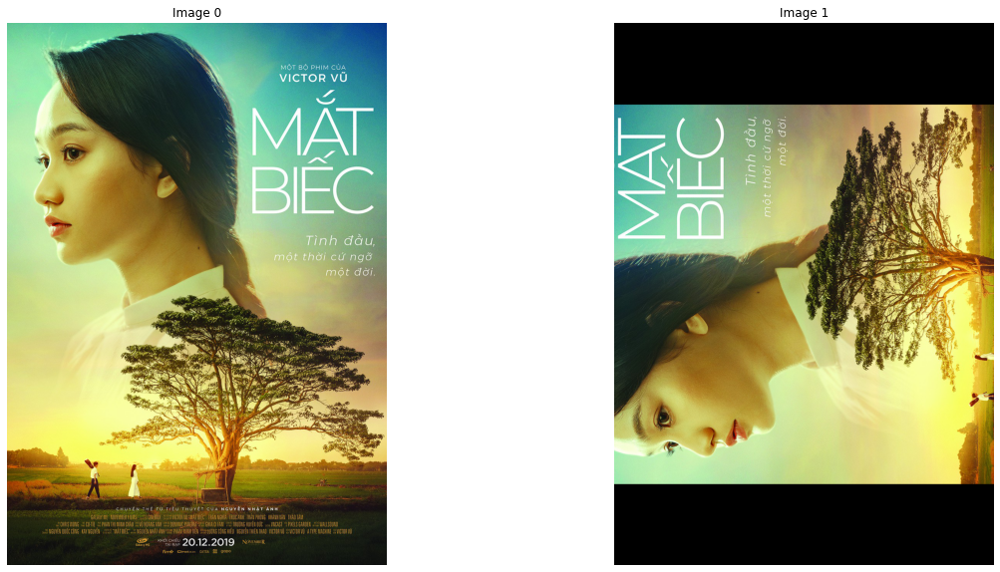

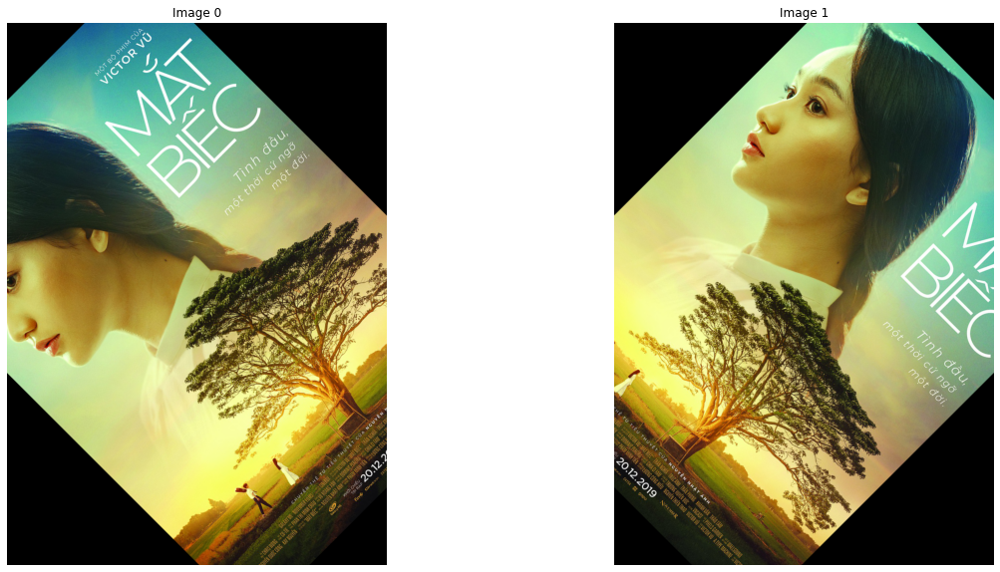

In [13]:
rows,cols = image_color.shape[:2]

RotationMatrix = cv2.getRotationMatrix2D((cols/2,rows/2),90,1)
image_rotation01 = cv2.warpAffine(image_color,RotationMatrix,(cols,rows))
RotationMatrix = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)
image_rotation02 = cv2.warpAffine(image_color,RotationMatrix,(cols,rows))
RotationMatrix = cv2.getRotationMatrix2D((cols/2,rows/2),-45,1)
image_rotation03 = cv2.warpAffine(image_color,RotationMatrix,(cols,rows))

ShowImage([image_color, image_rotation01], 1, 2)
ShowImage([image_rotation02, image_rotation03], 1, 2)

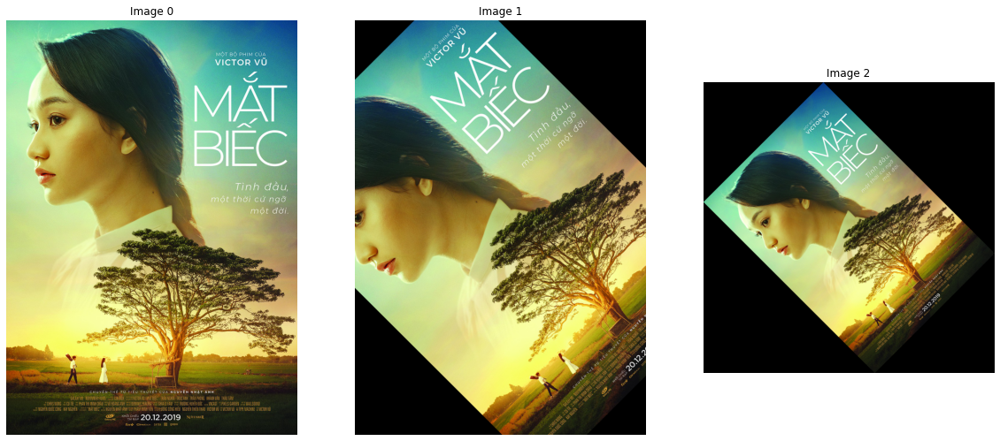

In [15]:
import imutils

image_rotated45 = imutils.rotate(image_color, 45)
image_rotated45_bound = imutils.rotate_bound(image_color, -45)
ShowImage([image_color, image_rotated45, image_rotated45_bound], 1, 3)

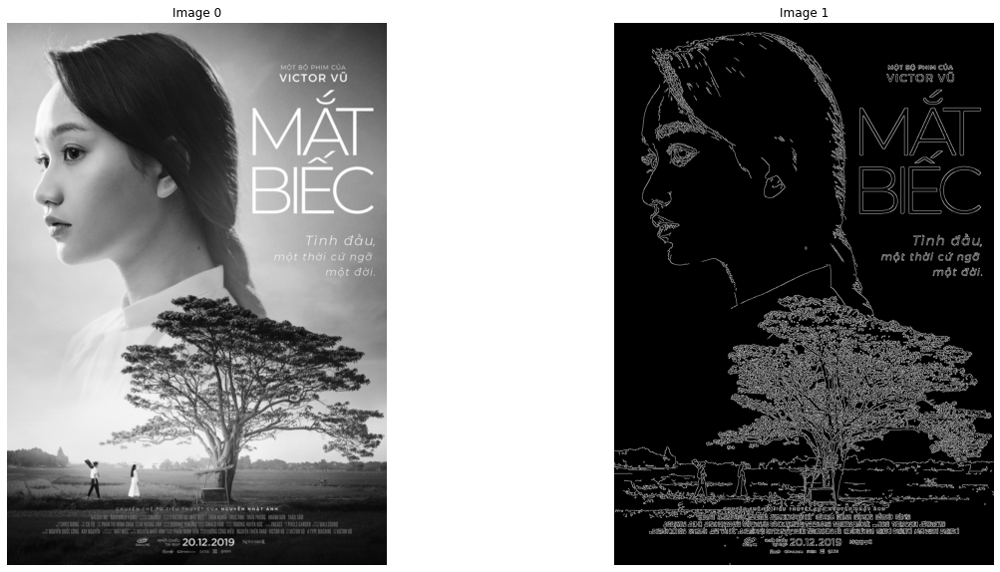

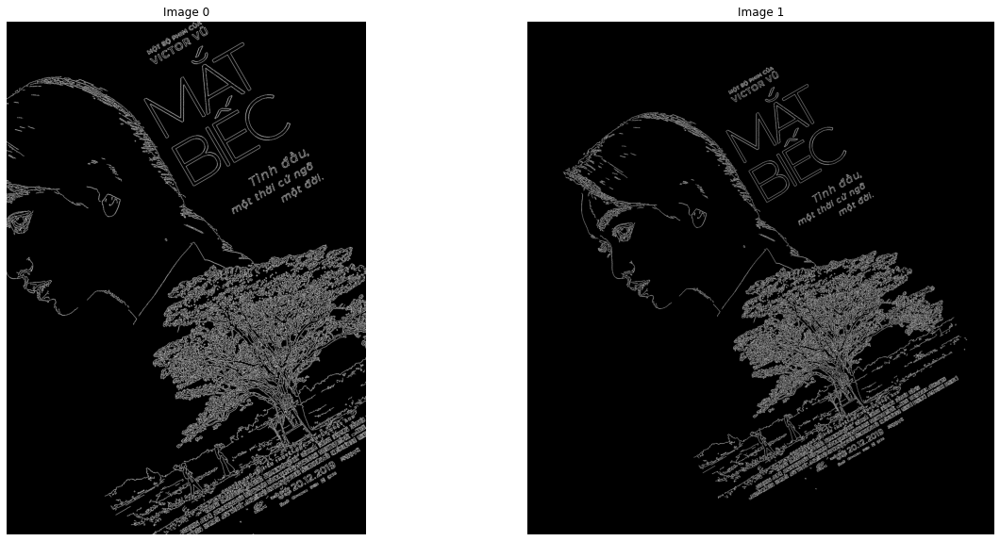

In [16]:
image_gray_blur = cv2.GaussianBlur(image_gray, (3, 3), 0)
image_edged = cv2.Canny(image_gray_blur, 50, 100)
image_edged_rotated45 = imutils.rotate(image_edged, 30)
image_edged_rotated45_bound = imutils.rotate_bound(image_edged, -30)
ShowImage([image_gray_blur, image_edged], 1, 2)
ShowImage([image_edged_rotated45, image_edged_rotated45_bound], 1, 2)

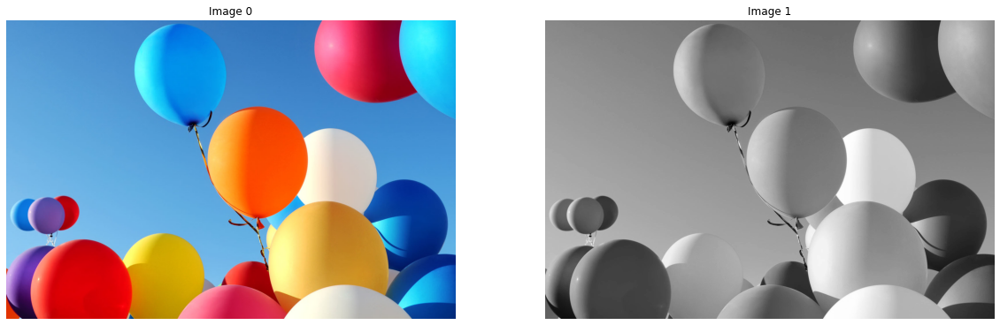

In [17]:
# Read Image

image_color = imread("Image/balloon.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

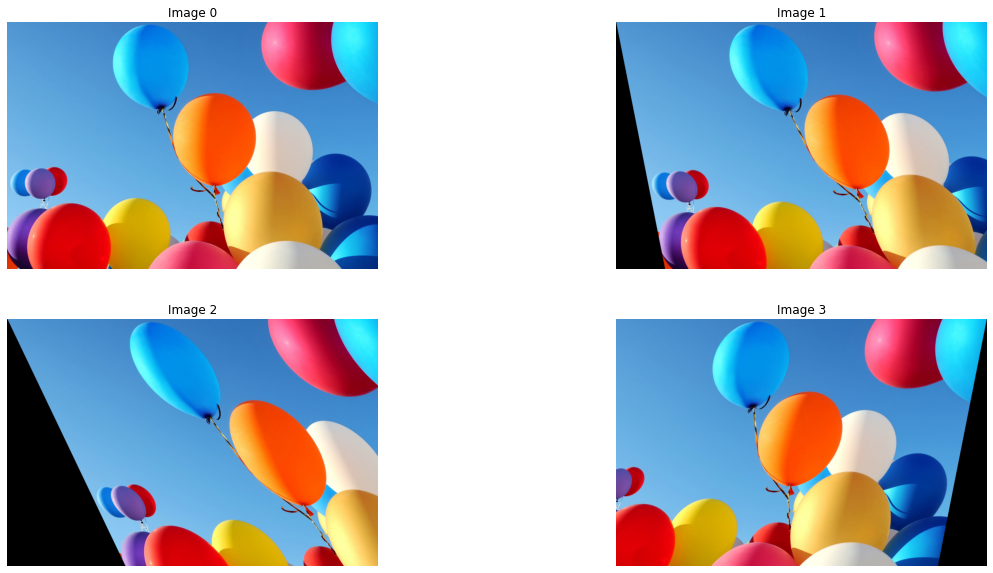

In [18]:
from skimage import transform as tf

# Create Afine transform
afine_tf = tf.AffineTransform(shear=0.2)
image_shear01 = tf.warp(image_color, inverse_map=afine_tf)
afine_tf = tf.AffineTransform(shear=0.5)
image_shear02 = tf.warp(image_color, inverse_map=afine_tf)
afine_tf = tf.AffineTransform(shear=-0.2)
image_shear03 = tf.warp(image_color, inverse_map=afine_tf)
ShowImage([image_color, image_shear01, image_shear02, image_shear03], 2, 2)

Width :  700  Height :  400  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  255
Blue - Min Intensity:  0  Max Intensity:  255


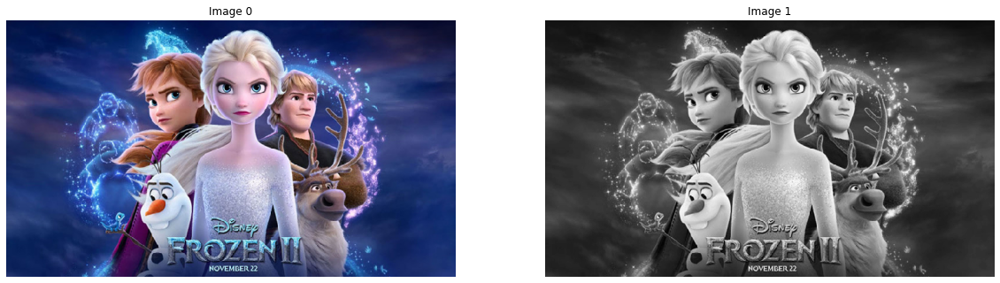

In [20]:
# Read Image

image_color = imread("Image/frozen.jpg")
image_color = ResizeImage(image_color, 700, 400)
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
InfoImage(image_color)
ShowImage([image_color, image_gray], 1, 2)

Matrix : 


array([[  1.26666667,   0.6       , -83.33333333],
       [ -0.33333333,   1.        ,  66.66666667]])

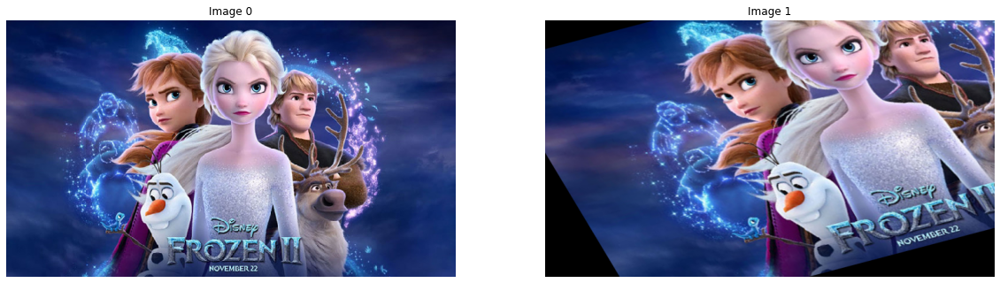

In [21]:
rows,cols = image_color.shape[:2]

PointList_From = [[50,50],[200,50],[50,200]]
PointList_To = [[10,100],[200,50],[100,250]]
pts1 = np.float32(PointList_From)
pts2 = np.float32(PointList_To)
MappingMatrix = cv2.getAffineTransform(pts1,pts2)
image_Affine = cv2.warpAffine(image_color,MappingMatrix,(cols,rows))
print("Matrix : ")
display(MappingMatrix)
ShowImage([image_color, image_Affine], 1, 2)

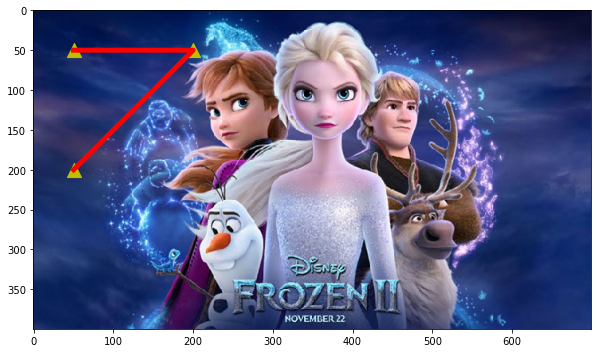

In [22]:
XList = []
YList = []
for pt in PointList_From:
    XList.append(pt[0])
    YList.append(pt[1])
plt.figure(figsize=(10,10))
plt.imshow(image_color)
plt.scatter(XList, YList, c='y', s=200, marker='^')
plt.plot(XList,YList,'r', linewidth=5, markersize=12)
plt.show()

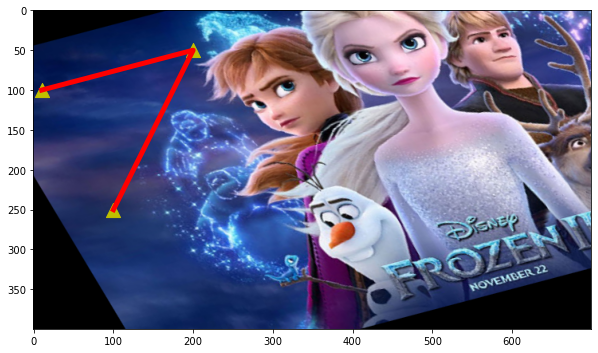

In [23]:
XList = []
YList = []
for pt in PointList_To:
    XList.append(pt[0])
    YList.append(pt[1])
plt.figure(figsize=(10,10))
plt.imshow(image_Affine)
plt.scatter(XList, YList, c='y', s=200, marker='^')
plt.plot(XList,YList,'r', linewidth=5, markersize=12)
plt.show()

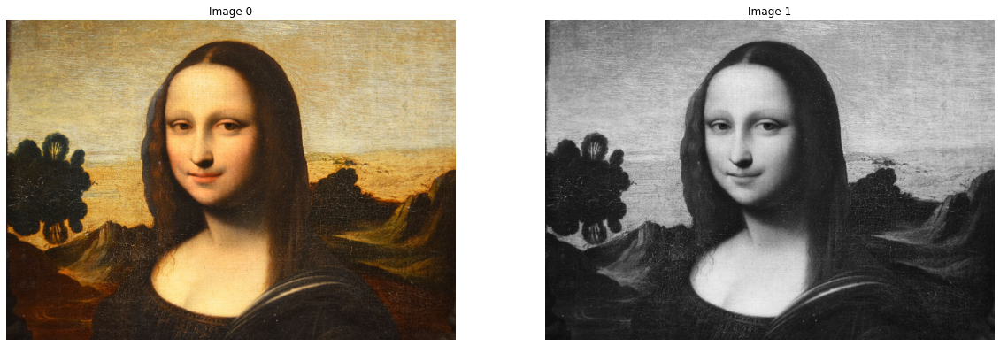

In [24]:
# Read Image

image_color = imread("Image/monalisa.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

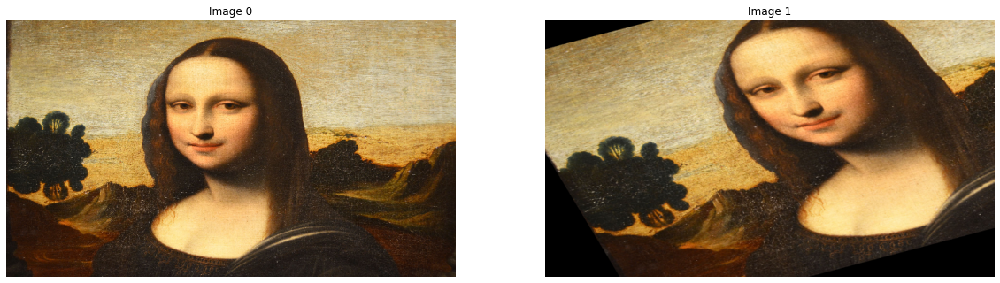

In [25]:
image_color = ResizeImage(image_color, 700, 400)

image_Affine = cv2.warpAffine(image_color,MappingMatrix,(cols,rows))
ShowImage([image_color, image_Affine], 1, 2)

Width :  419  Height :  423  Channel :  3
Red - Min Intensity:  4  Max Intensity:  214
Green - Min Intensity:  5  Max Intensity:  219
Blue - Min Intensity:  1  Max Intensity:  230


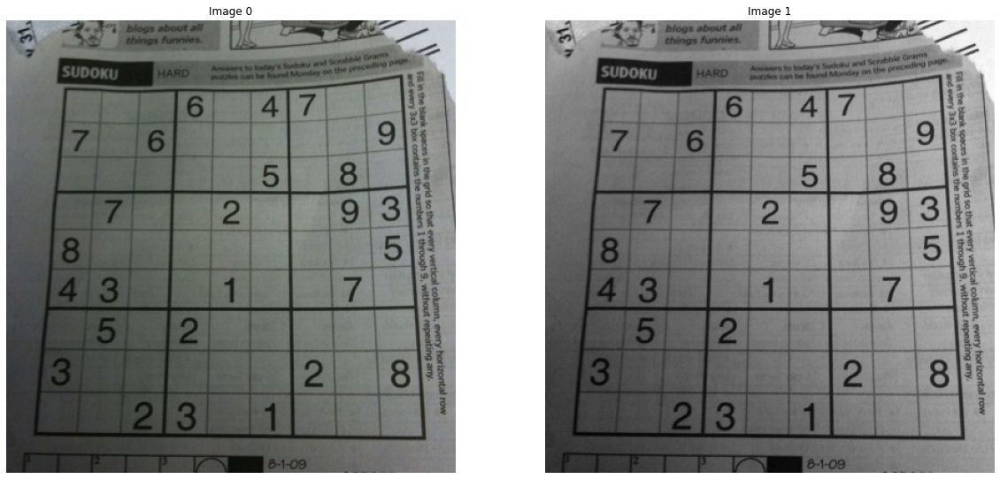

In [26]:
# Read Image

image_color = imread("Image/sudoku.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
InfoImage(image_color)
ShowImage([image_color, image_gray], 1, 2)

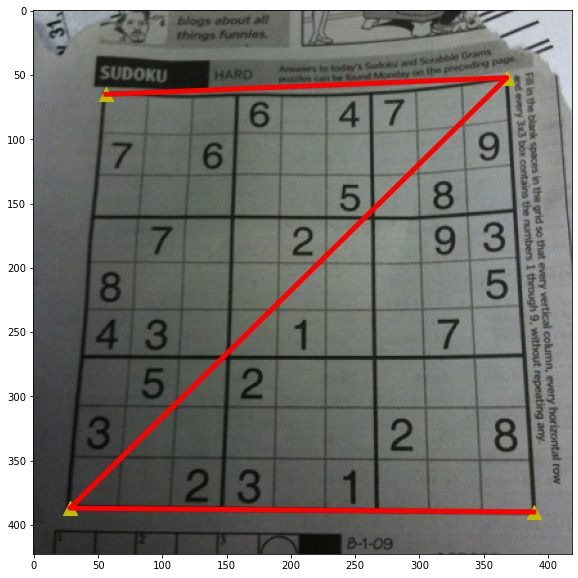

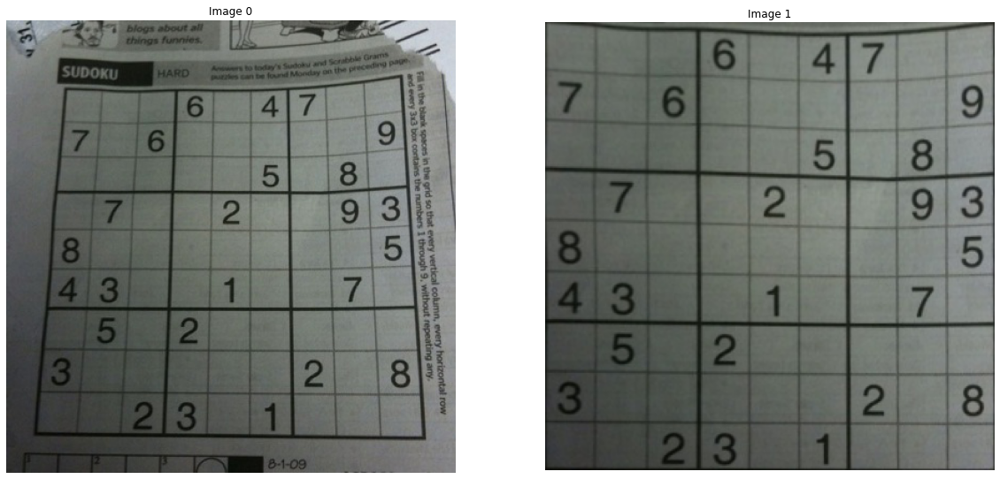

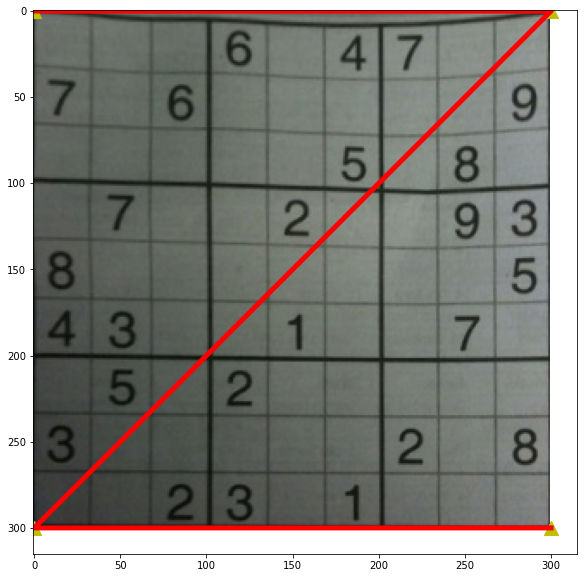

In [27]:
rows,cols,ch = image_color.shape

PointList_From = [[56,65],[368,52],[28,387],[389,390]]
PointList_To = [[0,0],[300,0],[0,300],[300,300]]
XList = []
YList = []
for pt in PointList_From:
    XList.append(pt[0])
    YList.append(pt[1])
plt.figure(figsize=(10,10))
plt.imshow(image_color)
plt.scatter(XList, YList, c='y', s=200, marker='^')
plt.plot(XList,YList,'r', linewidth=5, markersize=12)
plt.show()

pts1 = np.float32(PointList_From)
pts2 = np.float32(PointList_To)
MappingMatrix = cv2.getPerspectiveTransform(pts1,pts2)
image_Perspective = cv2.warpPerspective(image_color,MappingMatrix,(300,300))
ShowImage([image_color, image_Perspective], 1, 2)
XList = []
YList = []
for pt in PointList_To:
    XList.append(pt[0])
    YList.append(pt[1])
plt.figure(figsize=(10,10))
plt.imshow(image_Perspective)
plt.scatter(XList, YList, c='y', s=200, marker='^')
plt.plot(XList,YList,'r', linewidth=5, markersize=12)
plt.show()